<a href="https://colab.research.google.com/github/lbattioni/DS_coder_house/blob/main/ProyectoDS_parteI_Battioni.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Proyecto DS parte 1.
###  **Alumno**: Luciano Battioni
---
## Abstract

Las enfermedades cardiovasculares son la principal causa de muerte a nivel mundial. Dentro de estas la enfermedad coronaria (EC) es la más frecuente.Su importancia global a llevado a investigadores del siglo XX ha desarrollar numerosos modelos predictores de eventos cardiovasculares (infarto agudo de miocardio, accidente cerebrovacular, muerte de causa vascular), tanto para la población general como para poblaciones particularmente vulnerables (pacientes diabéticos, pacientes con enfermedad renal crónica, etc.) con la esperanza de poder intervenir terapeúticamente y poder prevenirlos. Sin embargo, su validez externa y generalizabilidad han demostrado tener importantes limitaciones. Esto se ha debido, entre otras causas, a que se derivaron de cohortes de bajo número de pacientes, poco representativas de determinadas etnias o se construyeron pensando en la factibilidad de ser usados en consultorio por lo que solo utilizan variables seleccionadas, comprometiendo, tal vez, parte su precisión.

Las tecnicas de *Machine learning* (ML) procesan gran cantidad de variables sin necesidad de intervención de un clínico. Esto haría factible la implementación de modelos más precisos, dezplegables en ámbitos como EHR (*Electronic Health Records*) que permitan la estimación de riesgo cardiovascular en base a la información proporcionada por el sistema de manera automática.

El objetivo final del presente trabajo es generar un ML que permita predecir el evento de infarto agudo de miocardio en base a las variables de esta base sintética.

Para el primer entregable trabajaremos e intentaremos comprobar las siguientes hipótesis:

1. Relacionar los factores de riesgo cardiovacular con la cantidad de hs de ejercicio y sedentarismo. Entendiendo que es más probable que los pacientes con mayores factores de riesgo son los más sedentarios.
1. Relacionar los niveles de tensión arterial sistólica y diastólica con los niveles de Stress
1. Relacionar país, región con la dieta. Entendiendo que la idiosincracia local afecta hábitos alimenticios.

Fuente de la base sintética [link](https://www.kaggle.com/datasets/iamsouravbanerjee/heart-attack-prediction-dataset)

## Glosario de variables


Variable  | Descripción
-------------------|------------------
1.	Patient ID| texto, identificador del caso
2.	Age| numérica edad del paciente
3.	Sex| dicotómica (Male/Female)
4.	Cholesterol| numérica, nivel de colesterol en mg/dl
5.	Blood Pressure| texto, contiene tanto diastólica como sistólica separadas por barra invertida.
6.	Heart Rate| numérica, frecuencia cardíaca
7.	Diabetes| dicotómica, si el paciente tiene diabetes
8.	Family History| dicotómica, si tiene antecedentes familiares de enfermedad cardíaca (1: Yes, 0: No)
9.	Smoking| dicotómica, si el paciente fuma actualmente (1: Smoker, 0: Non-smoker)
10.	Obesity | dicotómica, si el paciente es obeso (1: Obese, 0: Not obese)
11.	Alcohol Consumption | categórica, el nivel de consume de alcohol.(None/Yes)
12.	Exercise Hours Per Week| numérica, número de horas de actividad física por semana
13.	Diet| categórica, hábitos dietarios(Healthy/Average/Unhealthy)
14.	Previous Heart Problems| dicotómica, antecedentes de problemas cardíacos del paciente (1: Yes, 0: No)
15.	Medication Use| dicotómica, si el paciente usa medicación (1: Yes, 0: No)
16.	Stress Level| categórica, nivel de stress del paciente(1-10)
17.	Sedentary Hours Per Day| numérica, horas de actividad Sedentaria por día
18.	Income| numérica, ingresos anuales en USD
17.	BMI| numérica, el resultado de dividir peso/altura**2
19.	Triglycerides| numérica, nivel de triglicéridos en mg/dl
20.	Physical Activity Days Per Week| numérica, días de actividad física por semana
21.	Sleep Hours Per Day|numérica, número de horas de sueño por día
22.	Country| nominal, procedencia del paciente
23.	Continent| nominal, continente del país de procedencia
24.	Hemisphere| nominal, Hemisferio del continente del país de procedencia
25.	Heart Attack Risk| dicotómica, presencia de riesgo de infarto (1: Yes, 0: No)

# Importo paquetes

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
pd.set_option("display.max_columns",30)
pd.options.display.float_format = '{:.2f}'.format

In [2]:
# cargo data frame desde mi repositorio en GitHub
df_raw=pd.read_csv('https://raw.githubusercontent.com/lbattioni/DS_coder_house/main/heart_attack_prediction_dataset.csv',sep=';')

# ETL

In [3]:
#veo head del df para entender los datos
'''
veo que hay varias variables que necesitan ajustar sus valores como excersice HPW, sedentary HPD, BMI etc.
en principio también voy a poner _ entre los espacios libres de las variables y
 voy a poner todo en minuscula para que sea más facil acceder a los valores
 '''
df_raw.head()


,Patient ID,Age,Sex,Cholesterol,Blood Pressure,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Continent,Hemisphere,Heart Attack Risk
0,BMW7812,67,Male,208,158/88,72,0,0,1,0,0,4.17,Average,0,0,9,6.62,261404,31.25,286,0,6,Argentina,South America,Southern Hemisphere,0
1,CZE1114,21,Male,389,165/93,98,1,1,1,1,1,1.81,Unhealthy,1,0,1,4.96,285768,27.19,235,1,7,Canada,North America,Northern Hemisphere,0
2,BNI9906,21,Female,324,174/99,72,1,0,0,0,0,2.08,Healthy,1,1,9,9.46,235282,28.18,587,4,4,France,Europe,Northern Hemisphere,0
3,JLN3497,84,Male,383,163/100,73,1,1,1,0,1,9.83,Average,1,0,9,7.65,125640,36.46,378,3,4,Canada,North America,Northern Hemisphere,0
4,GFO8847,66,Male,318,91/88,93,1,1,1,1,0,5.80,Unhealthy,1,0,6,1.51,160555,21.81,231,1,5,Thailand,Asia,Northern Hemisphere,0


In [4]:
#cambio a minuscula los nombres de las columnas y cambio los espacios por _
df_raw.columns=df_raw.columns.str.replace(' ','_')
df_raw.columns=df_raw.columns.str.lower()
df_raw.columns

Index(['patient_id', 'age', 'sex', 'cholesterol', 'blood_pressure',
       'heart_rate', 'diabetes', 'family_history', 'smoking', 'obesity',
       'alcohol_consumption', 'exercise_hours_per_week', 'diet',
       'previous_heart_problems', 'medication_use', 'stress_level',
       'sedentary_hours_per_day', 'income', 'bmi', 'triglycerides',
       'physical_activity_days_per_week', 'sleep_hours_per_day', 'country',
       'continent', 'hemisphere', 'heart_attack_risk'],
      dtype='object')

In [5]:
#chequeo los dtypes (necesitan ajustarse) y veo valores NaN (ya se que no hay porque la descripción del DF así lo indica)
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 26 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   patient_id                       8763 non-null   object 
 1   age                              8763 non-null   int64  
 2   sex                              8763 non-null   object 
 3   cholesterol                      8763 non-null   int64  
 4   blood_pressure                   8763 non-null   object 
 5   heart_rate                       8763 non-null   int64  
 6   diabetes                         8763 non-null   int64  
 7   family_history                   8763 non-null   int64  
 8   smoking                          8763 non-null   int64  
 9   obesity                          8763 non-null   int64  
 10  alcohol_consumption              8763 non-null   int64  
 11  exercise_hours_per_week          8763 non-null   float64
 12  diet                

In [6]:
#dejo patient_id como object
df_raw.age=df_raw.age.astype('int8')
df_raw.sex=df_raw.sex.astype('category')
df_raw.cholesterol=df_raw.cholesterol.astype('int32')
#blood_pressure la cambio despues porque la tengo que dividir
df_raw.heart_rate=df_raw.heart_rate.astype('int8')
df_raw.diabetes=df_raw.diabetes.astype('category')
df_raw.family_history=df_raw.family_history.astype('category')
df_raw.smoking=df_raw.smoking.astype('category')
df_raw.obesity=df_raw.obesity.astype('category')
df_raw.alcohol_consumption=df_raw.alcohol_consumption.astype('category')
df_raw.exercise_hours_per_week=round(df_raw.exercise_hours_per_week,2).astype('float32')
df_raw.diet=df_raw.diet.astype('category')
df_raw.diet=df_raw.diet.cat.reorder_categories(['Healthy', 'Average', 'Unhealthy'], ordered=True)
df_raw.previous_heart_problems=df_raw.previous_heart_problems.astype('category')
df_raw.medication_use=df_raw.medication_use.astype('category')
df_raw.stress_level=df_raw.stress_level.astype('category')
df_raw.stress_level=df_raw.stress_level.cat.reorder_categories([1,2,3,4,5,6,7,8,9,10], ordered=True)
df_raw.bmi=round(df_raw.bmi,2).astype('float32')
df_raw.income=df_raw.income.astype('int32')
df_raw.sedentary_hours_per_day=round(df_raw.sedentary_hours_per_day,2).astype('float32')
df_raw.triglycerides=df_raw.triglycerides.astype('int32')
df_raw.physical_activity_days_per_week=df_raw.physical_activity_days_per_week.astype('category')
df_raw.physical_activity_days_per_week=df_raw.physical_activity_days_per_week.cat.reorder_categories([0,1,2,3,4,5,6,7], ordered=True)
df_raw.sleep_hours_per_day=df_raw.sleep_hours_per_day.astype('int8')
df_raw.country=df_raw.country.astype('category')
df_raw.continent=df_raw.continent.astype('category')
df_raw.hemisphere=df_raw.hemisphere.astype('category')
df_raw.heart_attack_risk=df_raw.heart_attack_risk.astype('category')

# pendiente arreglar  BP,


In [7]:
#creo una variable para presión sistólica y otra para diastólica
df_raw['bps']=[pd.to_numeric(i.split('/')[0],downcast='integer') for i in df_raw.blood_pressure]
df_raw['bpd']=[pd.to_numeric(i.split('/')[1],downcast='integer') for i in df_raw.blood_pressure]
#saco la columna blood_pressure ya que no la voy a usar
df_raw=df_raw.drop(columns='blood_pressure')

In [8]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 27 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   patient_id                       8763 non-null   object  
 1   age                              8763 non-null   int8    
 2   sex                              8763 non-null   category
 3   cholesterol                      8763 non-null   int32   
 4   heart_rate                       8763 non-null   int8    
 5   diabetes                         8763 non-null   category
 6   family_history                   8763 non-null   category
 7   smoking                          8763 non-null   category
 8   obesity                          8763 non-null   category
 9   alcohol_consumption              8763 non-null   category
 10  exercise_hours_per_week          8763 non-null   float32 
 11  diet                             8763 non-null   category
 12  previo

# EDA


## Análisis univariado

In [9]:
# describe
df_raw.describe()

,age,cholesterol,heart_rate,exercise_hours_per_week,sedentary_hours_per_day,income,bmi,triglycerides,sleep_hours_per_day,bps,bpd
count,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00
mean,53.71,259.88,75.02,10.01,5.99,158263.18,28.89,417.68,7.02,135.08,85.16
std,21.25,80.86,20.55,5.78,3.47,80575.19,6.32,223.75,1.99,26.35,14.68
min,18.00,120.00,40.00,0.00,0.00,20062.00,18.00,30.00,4.00,90.00,60.00
25%,35.00,192.00,57.00,4.98,3.00,88310.00,23.42,225.50,5.00,112.00,72.00
50%,54.00,259.00,75.00,10.07,5.93,157866.00,28.77,417.00,7.00,135.00,85.00
75%,72.00,330.00,93.00,15.05,9.02,227749.00,34.33,612.00,9.00,158.00,98.00
max,90.00,400.00,110.00,20.00,12.00,299954.00,40.00,800.00,10.00,180.00,110.00


Al ser una base de datos sintética se observa que todas las variables numéricas tiene una distribución aproximadamente normal. No se obesrvan valores min o max que no tengan sentido a la variable, aunque los triglicéridos y colesterol son muy elevados (aunque podrían verse en la práctica clínica, es infrecuente).
Desde el punto de vista de la población se pueden sacar las siguientes conclusiones:
1. la edad promedio es consistente con una población con afectación cardíaca
1. los niveles de colesterol y triglicérido promedio son bastante elevados

In [10]:
df_raw.describe(include='category')

,sex,diabetes,family_history,smoking,obesity,alcohol_consumption,diet,previous_heart_problems,medication_use,stress_level,physical_activity_days_per_week,country,continent,hemisphere,heart_attack_risk
count,8763,8763,8763,8763,8763,8763,8763,8763,8763,8763,8763,8763,8763,8763,8763
unique,2,2,2,2,2,2,3,2,2,10,8,20,6,2,2
top,Male,1,0,1,1,1,Healthy,0,0,2,3,Germany,Asia,Northern Hemisphere,0
freq,6111,5716,4443,7859,4394,5241,2960,4418,4396,913,1143,477,2543,5660,5624


La descripción de las variables categóricas arroja los siguientes datos que serían consistentes con el mundo real:
1. en una base de datos de pacientes con factores de riesgo cardiovascular es lógico ver mayoritariamente hombres
1. Hay mayor cantidad de diabetes, tabaquismo y obesidad, lo que sería consistente con los niveles de colesterol y triglicéridos comentados previamente.
1. Llama la atención que la categoría más frecuente sea el no uso de medicación. Por lo dicho previamente, la mayoría debería estar tomando alguna medicación. Sin embargo, esto es consistente con el mundo real, donde la mayoría de los pacientes esta subtratado.
1. La mayoría de los registros están sesgados para abarcar países del hemisferio norte, con lo cual esto es consistente en la base.

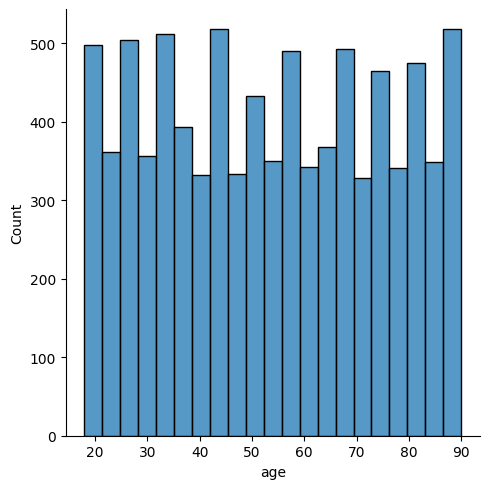

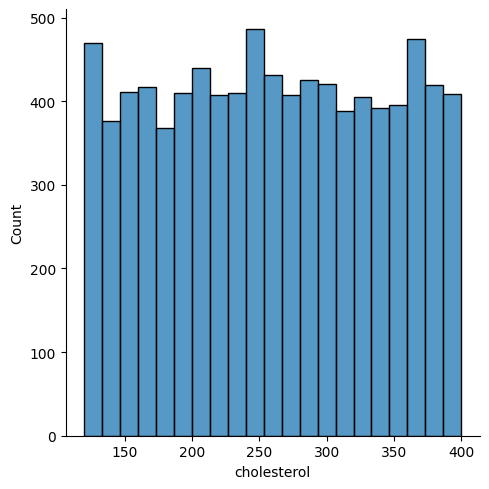

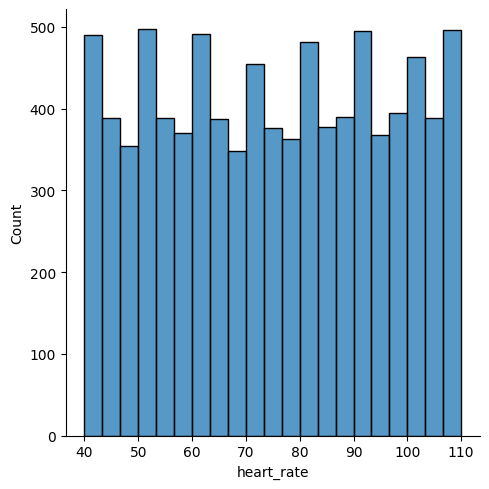

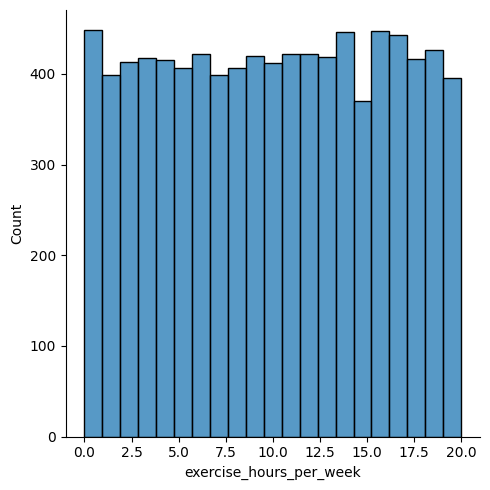

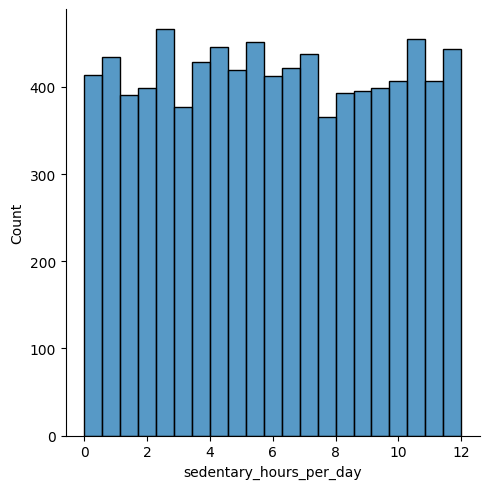

...

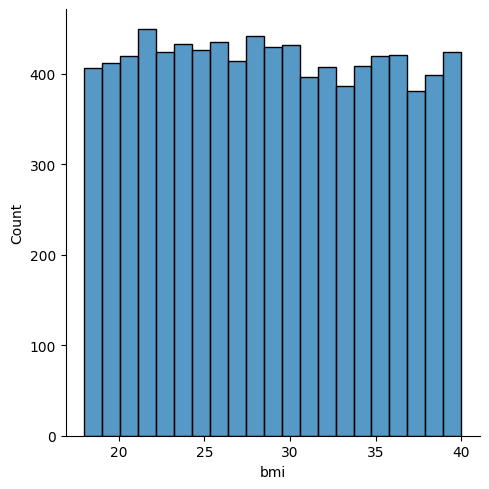

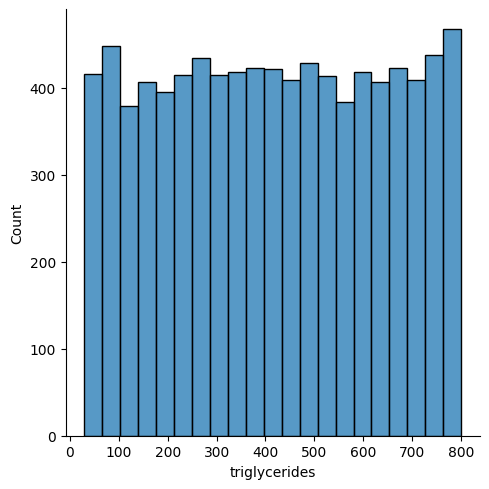

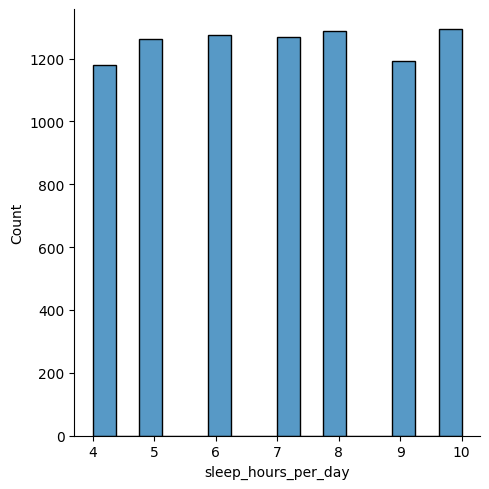

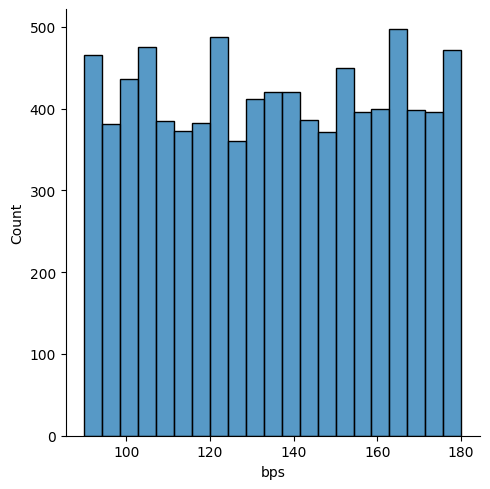

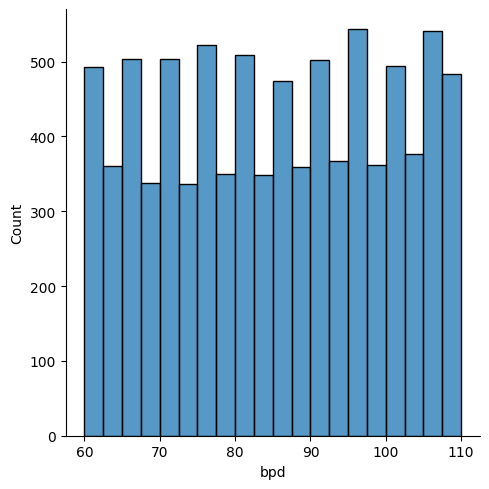

In [11]:
for i in df_raw.describe().columns:
  sns.displot(data=df_raw, x=i)
 #contrario a lo que pensaba en el desbribe todas las distribuciones son más o menos uniformes

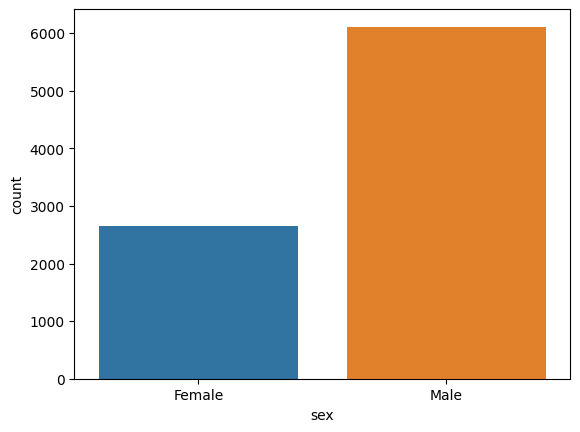

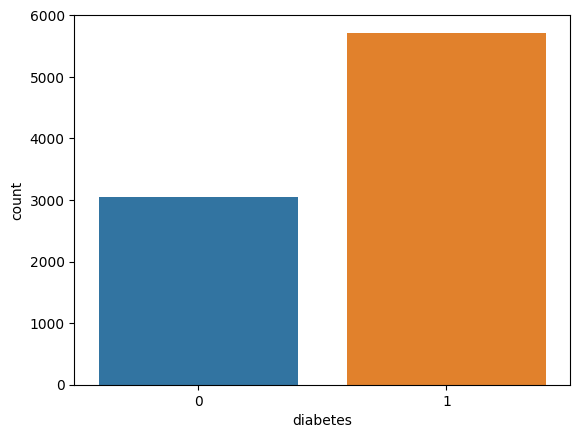

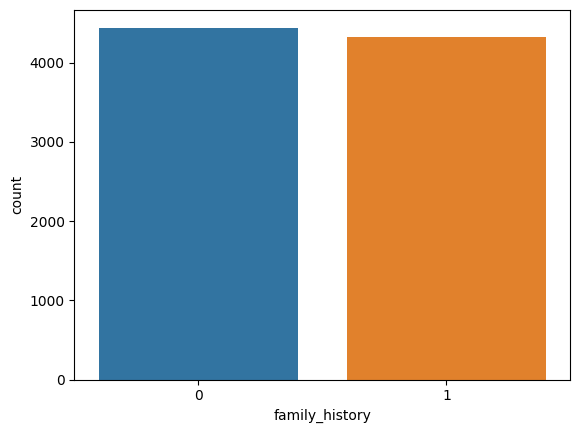

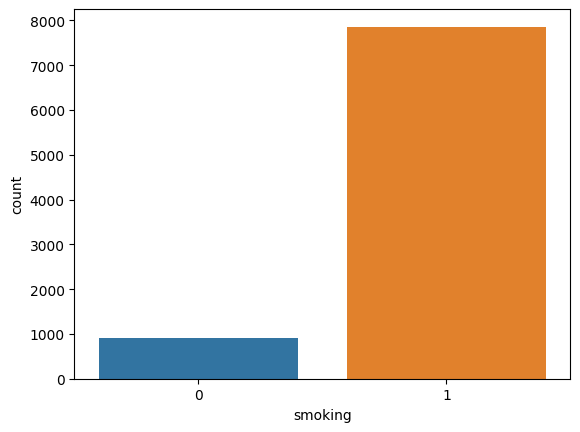

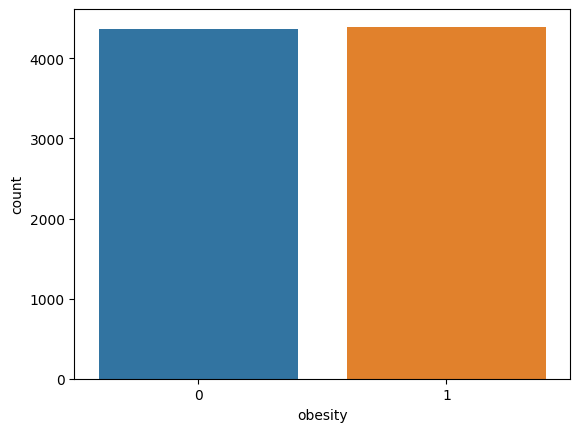

...

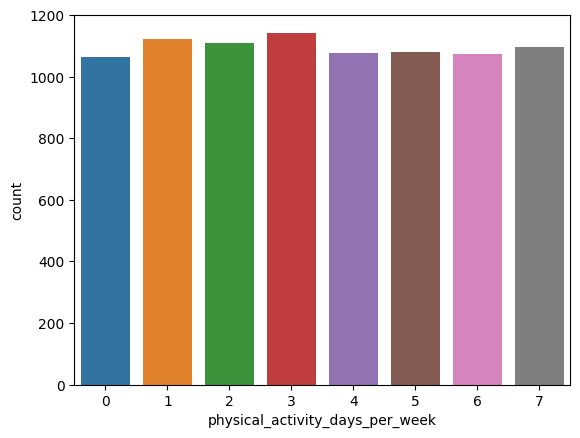

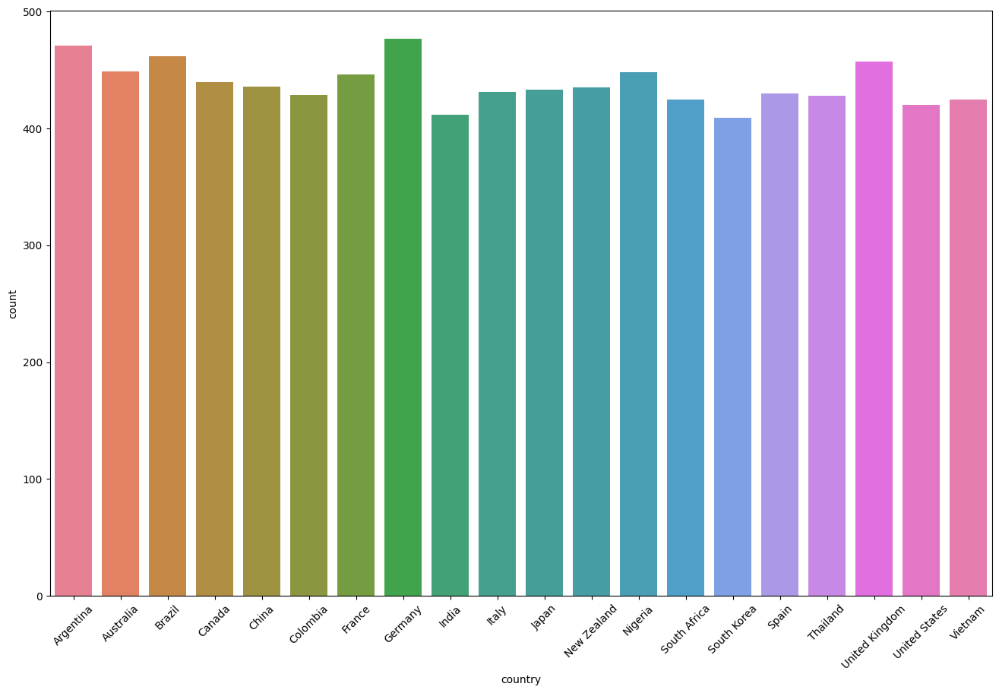

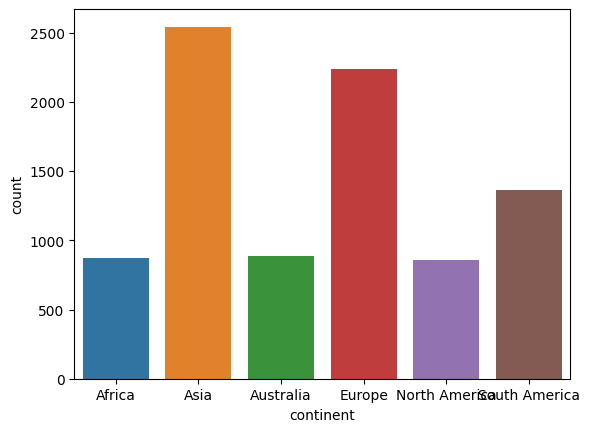

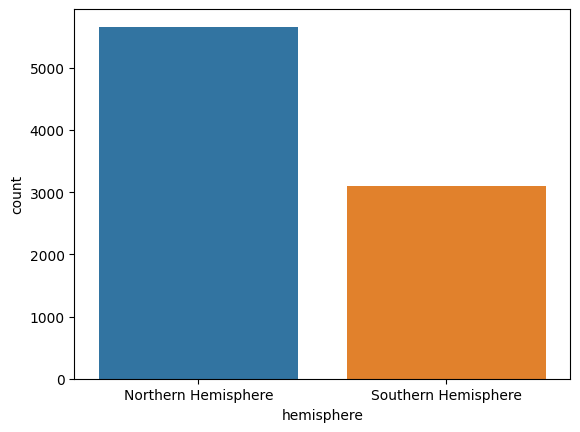

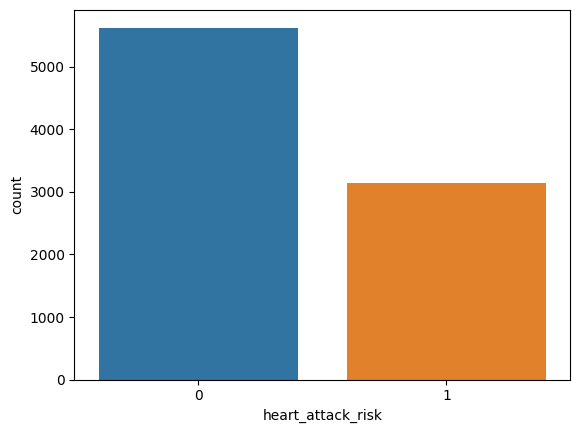

In [12]:
# en estos gráficos se observan que muchas variables estan valanceadas
#Excepto: sexo a predominio masc, diabetes a predomionio SI, fumar a predominio SI, consumo de alcohol a predomnio SI, los continentes precipalmente representados son ASIA y EUROPA
# Si bien los países individualmente tienen aprox la misma cantidad de observaciones hay más países europeos y asíaticos
# la mayoria de los pacientes no tuvo eventos coronarios
for i in df_raw.describe(include='category').columns:
  if i== 'country':
    plt.figure(figsize=(16,10))
    sns.countplot(data=df_raw, x=i ,hue=i,legend=False)
    plt.xticks(rotation=45)
    plt.show()
  else:
    sns.countplot(data=df_raw, x=i ,hue=i,legend=False)
    plt.show()

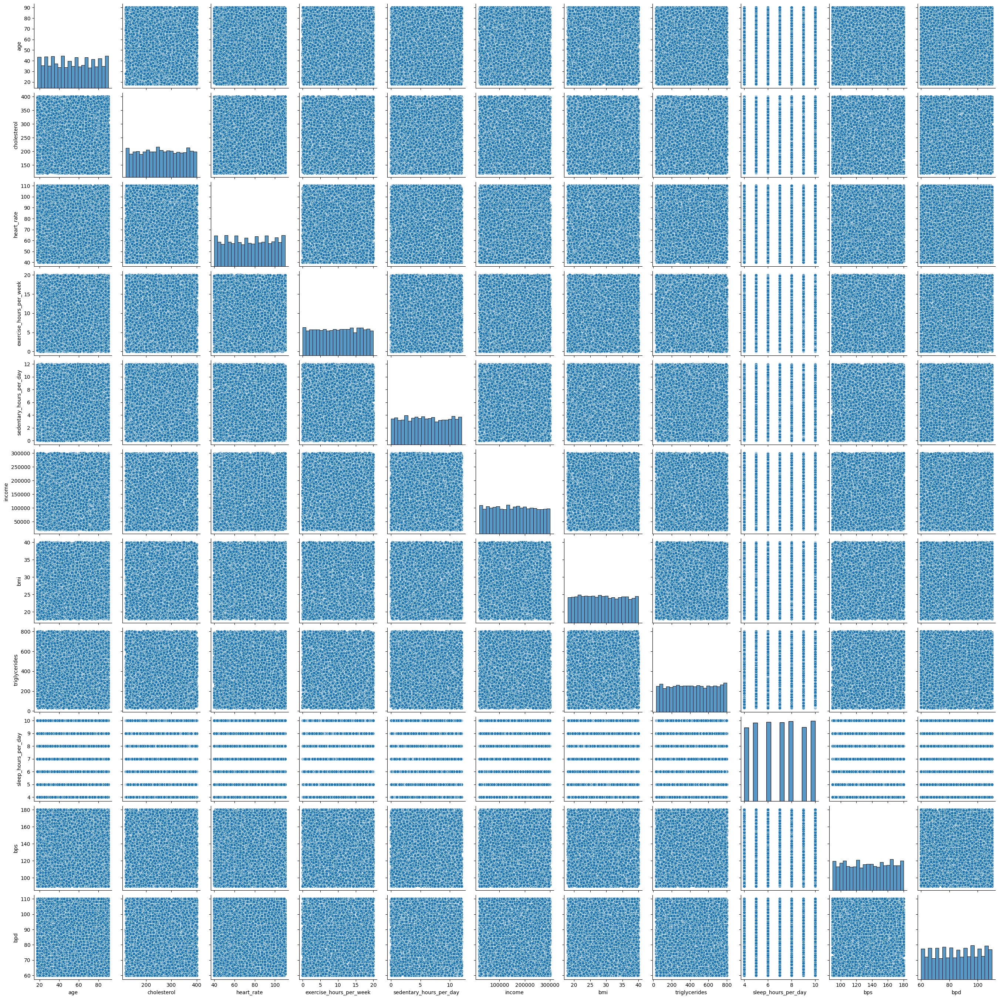

In [13]:
#este es un gráfico horrible pero muestra la distribución uniforme de las variables cuantitativas
sns.pairplot(data=df_raw)

## Análisis Bi y Tri variado


### Hipótesis 1: Relacionar los factores de riesgo cardiovacular con la cantidad de hs de ejercicio y sedentarismo

In [14]:
# Creo una lista de las columnas que son factores de riesgo cardiovascular y las variables de interes
(df_raw.columns)
frcv_cat=['sex','diabetes','family_history','smoking','obesity','diet','previous_heart_problems','stress_level']
frcv_con=['age','cholesterol','bmi','triglycerides']
target=['exercise_hours_per_week','sedentary_hours_per_day','physical_activity_days_per_week']

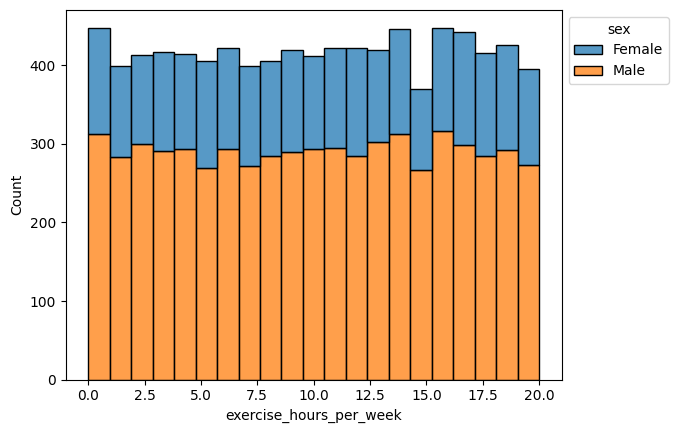

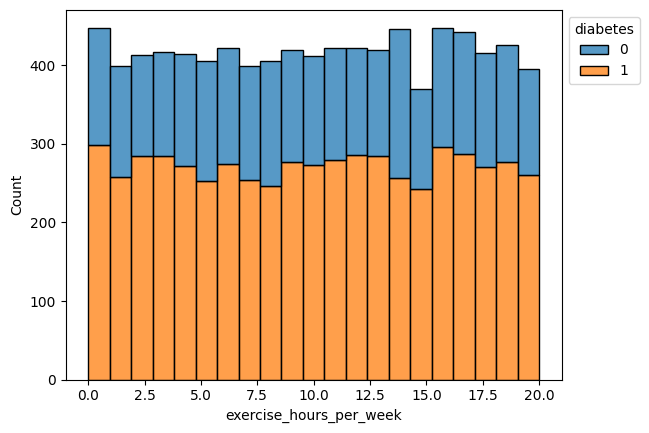

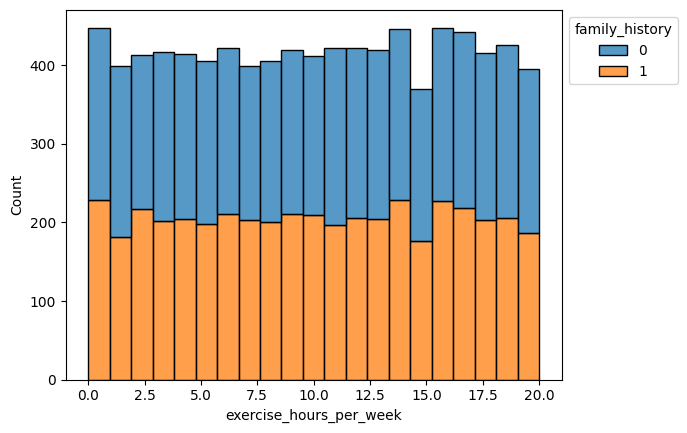

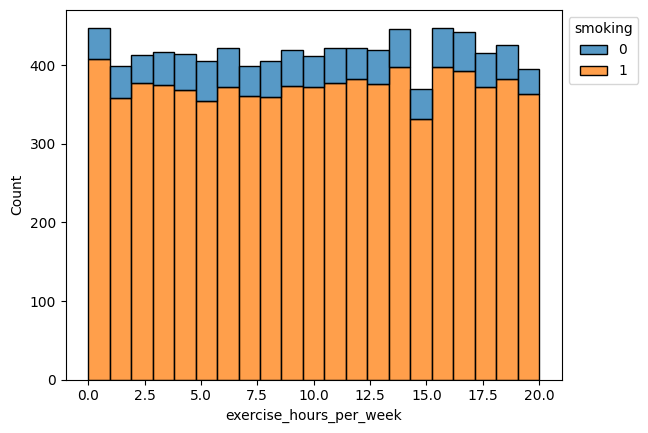

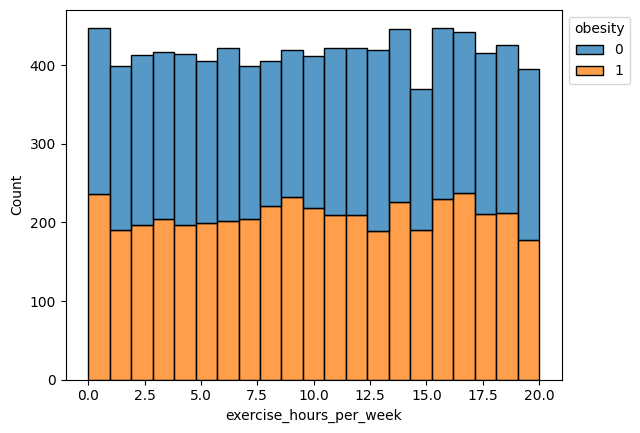

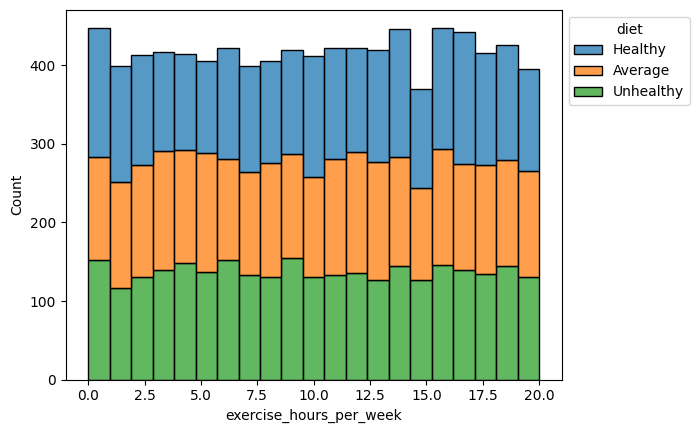

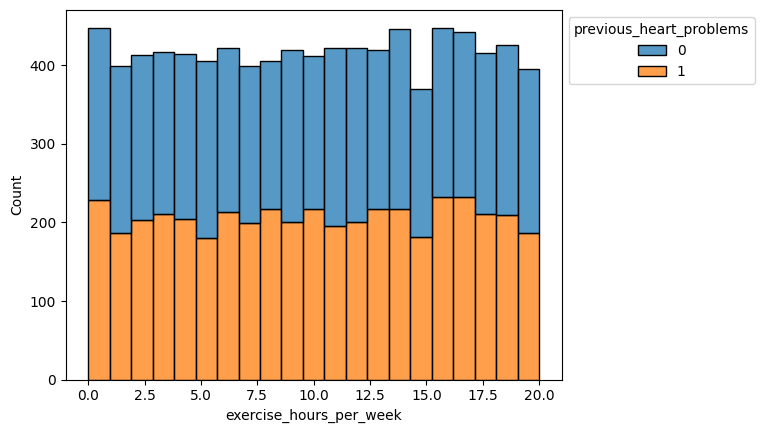

In [15]:
#vamos a empesar a analisar la excercise hours per week
#vemos distribucion uniforme de las hs de ejercicio en los sexos. Habiendo mayor cantidad de observaciones de los hombres
#vemos distribucion uniforme de las hs de ejercicio en diabetes. Siendo mayor la cantidad de pacientes diabaticos dentro del df
#vemos distribucion uniforme de las hs de ejercicio en antecedentes familiares. Habiendo una cantidad similar de observaciones
#vemos distribucion uniforme de las hs de ejercicio en estatus de fumador. Siendo la mayor'ia fumadores
#vemos distribucion uniforme de las hs de ejercicio en estatus de obeso. Siendo la cantidad de obesos similar en el df
#vemos distribucion uniforme de las hs de ejercicio de acuerdo al tipo de dieta. la cantidad de obesrvaciones por categoria es m'as o menos similar
#vemos distribucion uniforme de las hs de ejercicio de acuerdo al a la presencia previa de previuos heart problems. la cantidad de obesrvaciones por categoria es m'as o menos similar
for f in frcv_cat[:-1]:
  ax=sns.histplot(data=df_raw,x=target[0], hue=f,multiple='stack')
  sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
  plt.show()


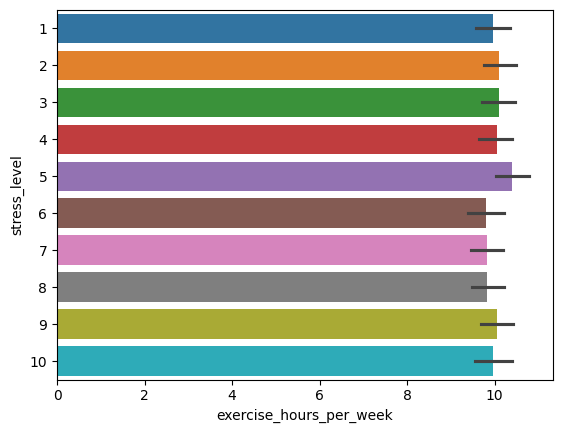

In [16]:
#vemos distribucion uniforme de las hs de ejercicio a lo largo de los niveles de stress.
sns.barplot(data=df_raw,x=target[0], y=frcv_cat[-1],hue=frcv_cat[-1],legend=False)
plt.show()


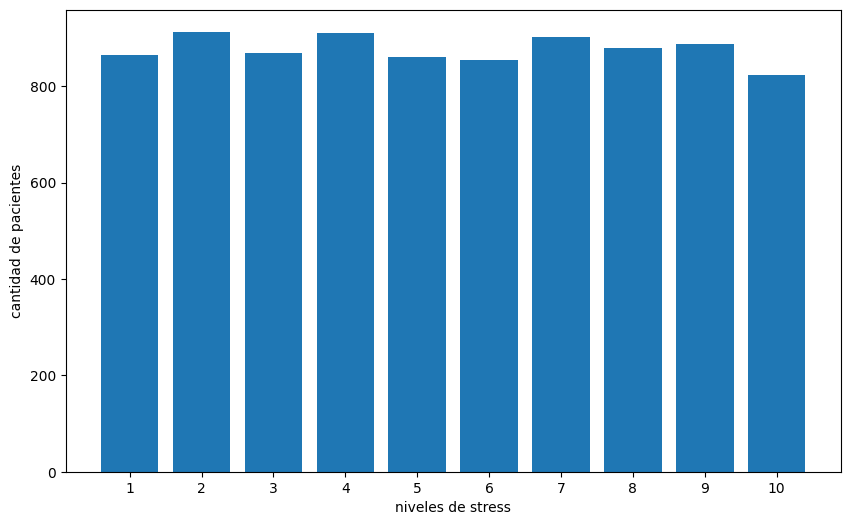

In [17]:
# la cantidad de observaciones se similar a lo largo de los niveles de stress.
fig,ax=plt.subplots(figsize=(10,6))
ax.bar(x=df_raw[frcv_cat[-1]].value_counts().index,height=df_raw[frcv_cat[-1]].value_counts().values)
ax.set_xticks(range(1,11))
ax.set_xlabel('niveles de stress')
ax.set_ylabel('cantidad de pacientes')
plt.show()

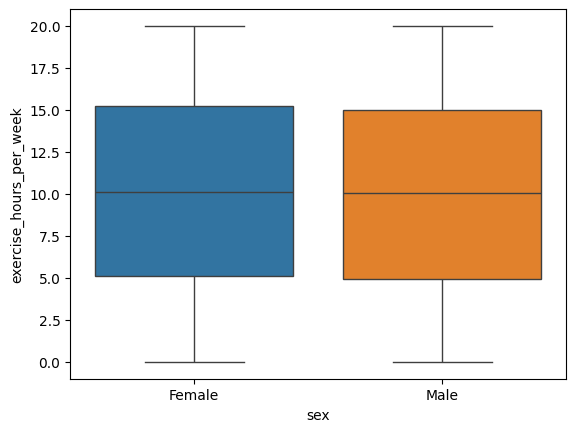

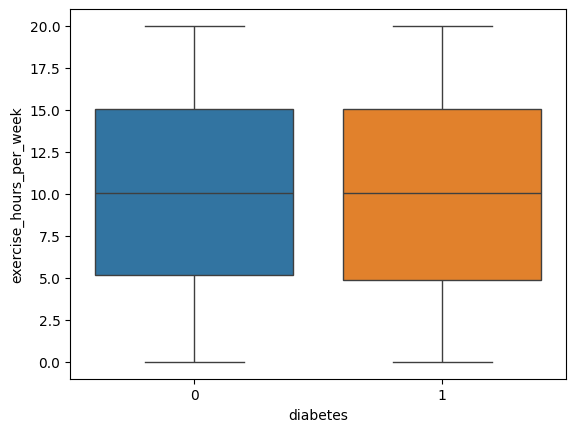

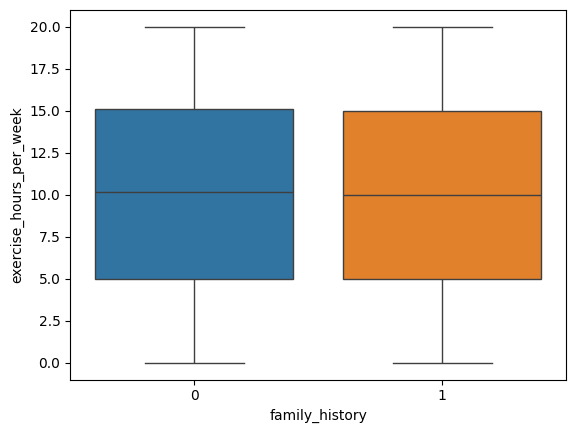

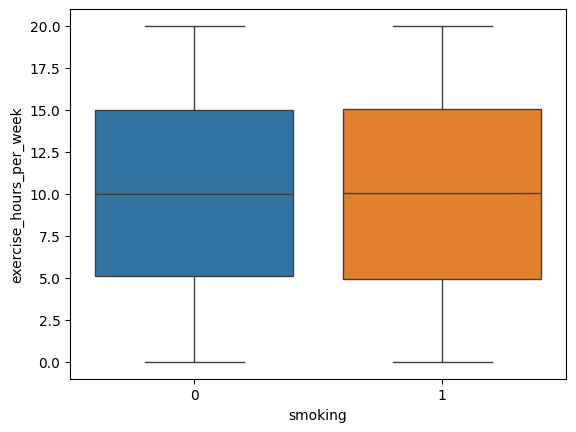

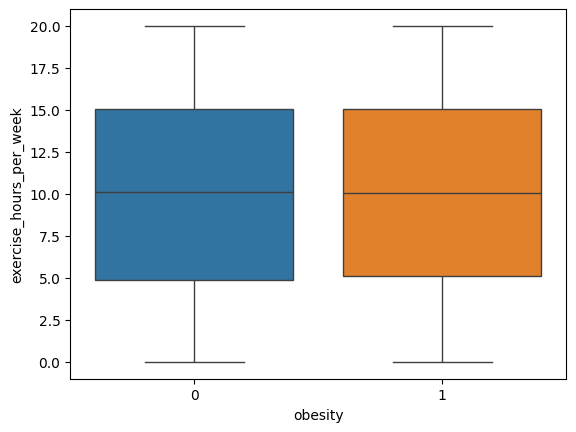

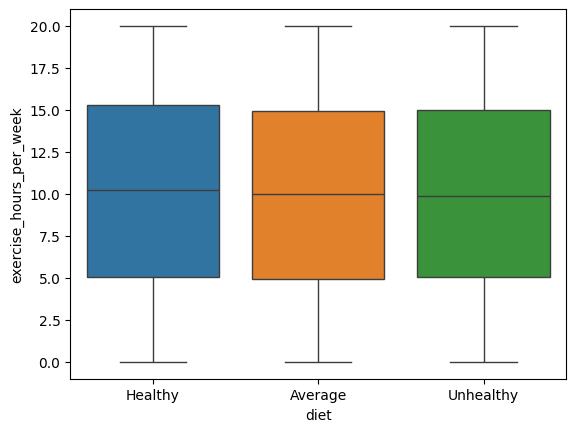

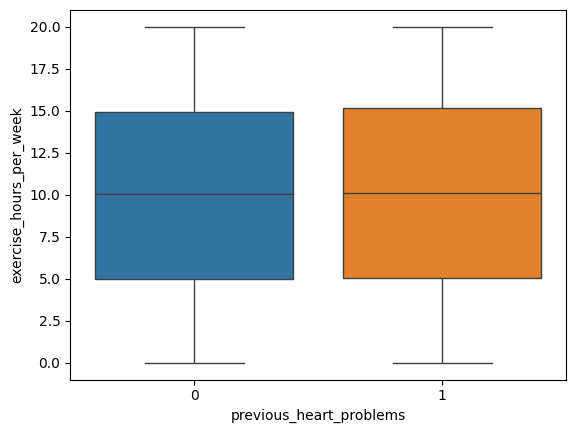

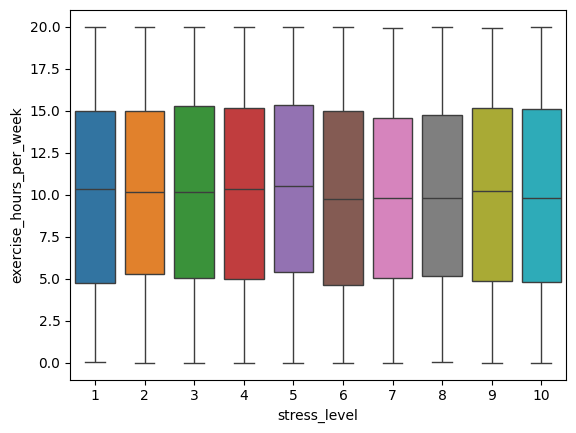

In [18]:
for f in frcv_cat:
  sns.boxplot(data=df_raw,y=target[0],x=f,hue=f,legend=False)
  plt.show()
#la cantidad de hs por ejercicio semanal es igual a lo largo de todas las categor'ias

Como conclusión podemos decir por ahora la cantidad de ejercicio medida en hs por semana demuestra una distribución homogénea en esta base sintética, no habiendo grandes diferencias entre los FRCV. Los FRCV se ecuentran equilibrados entre las categorías excepto sexo masculino, diabetes y fumador.

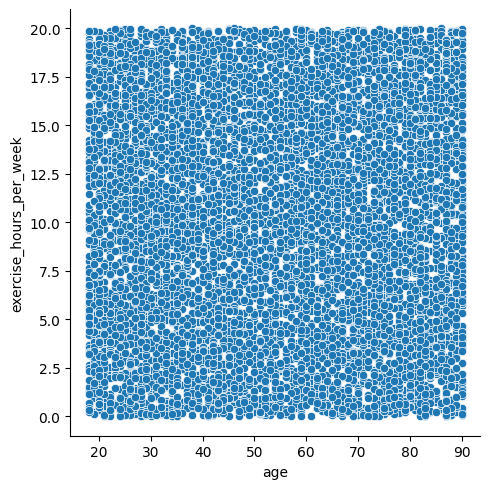

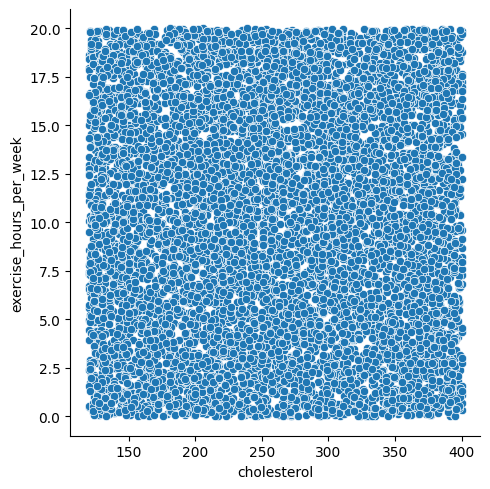

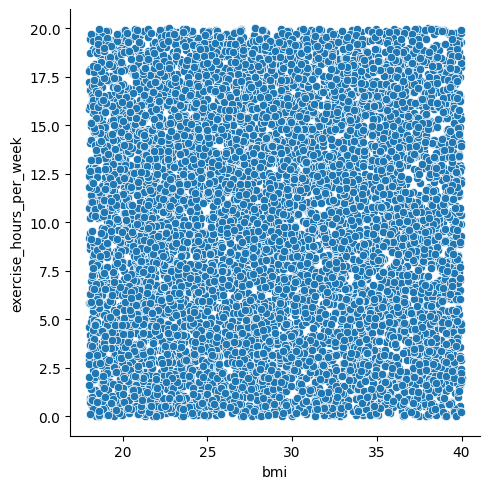

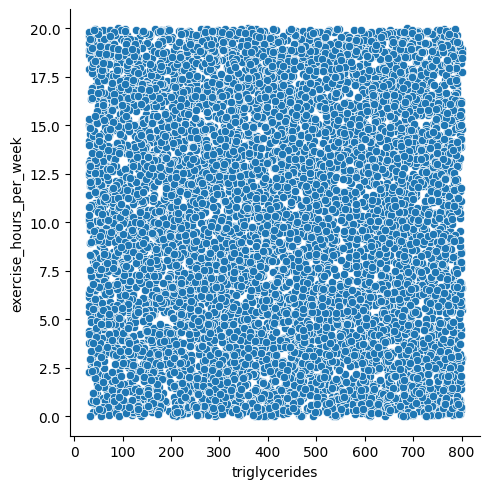

In [19]:
#variables cuantitativas.
#al haber distribucion homogena entodas las variables no se puede observar ninguna tendencia
for f in frcv_con:
  sns.relplot(data=df_raw,x=f,y=target[0])
  plt.show()

En conclusión en esta base sintética no puede observarse relación entre BMI, TG, Col con actividad física

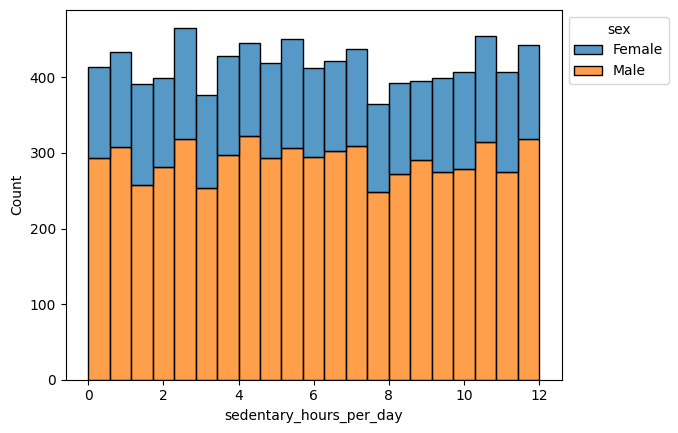

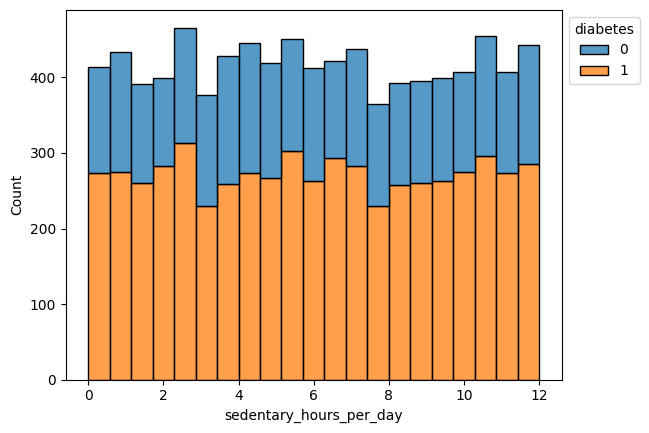

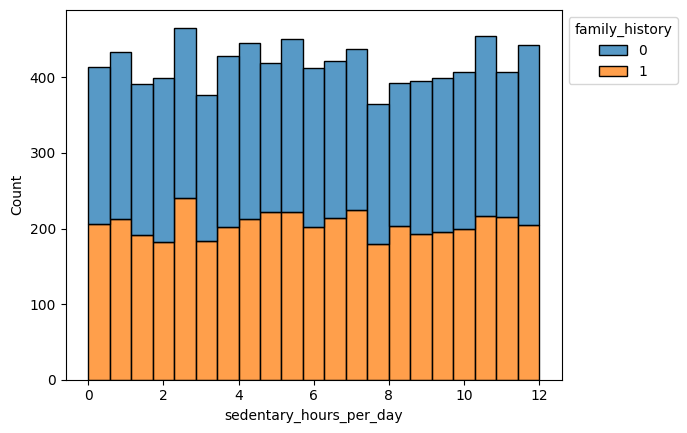

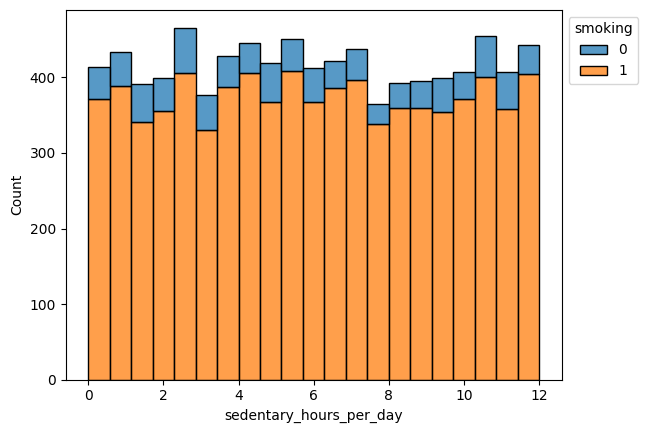

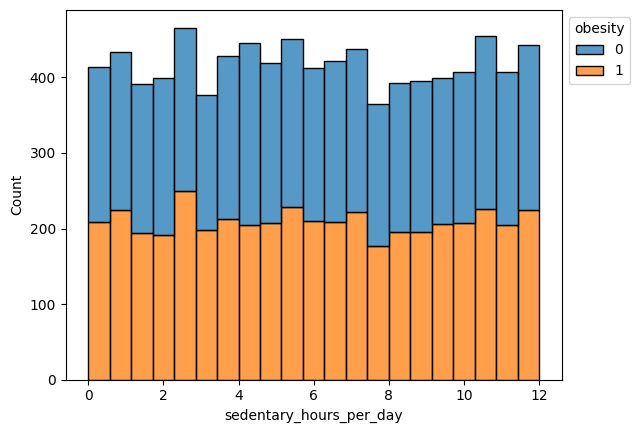

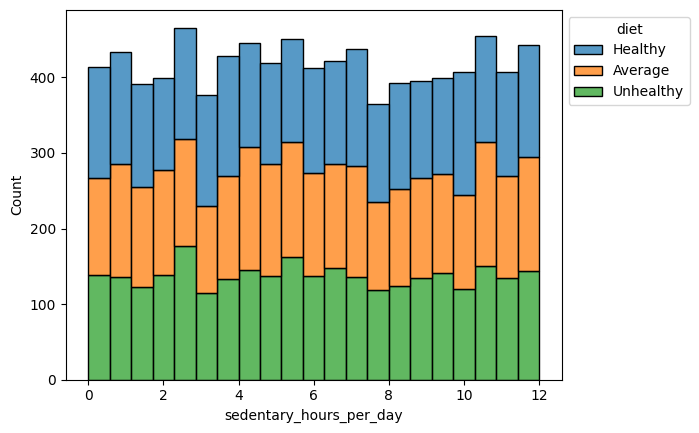

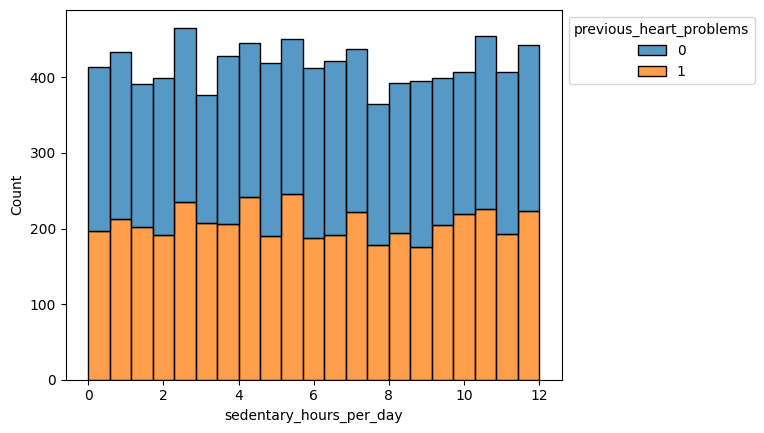

In [20]:
#se mantiene lo descripto previamente, la distribuci'on es homogenea y la cantidad de observaciones por categoria es similar,excepto, hombres, diabetes y fumadores
for f in frcv_cat[:-1]:
  ax=sns.histplot(data=df_raw,x=target[1], hue=f,multiple='stack')
  sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
  plt.show()

<Axes: xlabel='sedentary_hours_per_day', ylabel='stress_level'>

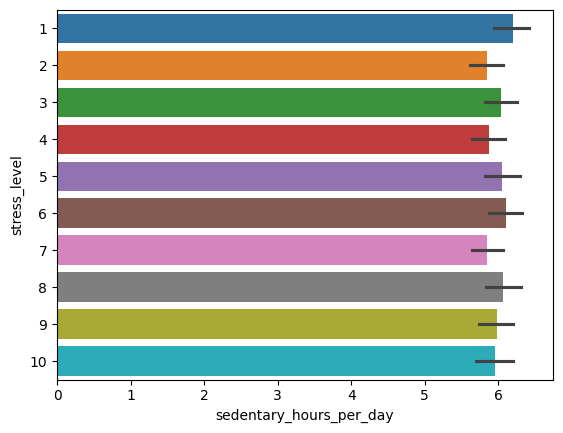

In [21]:
#misma conclusi'on que para ejercicio
sns.barplot(data=df_raw,x=target[1], y=frcv_cat[-1],hue=frcv_cat[-1],legend=False)

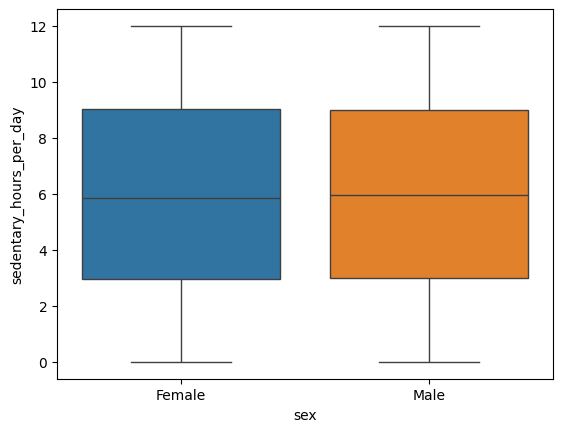

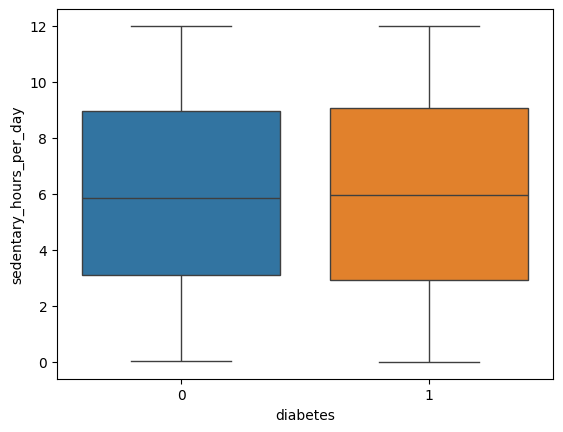

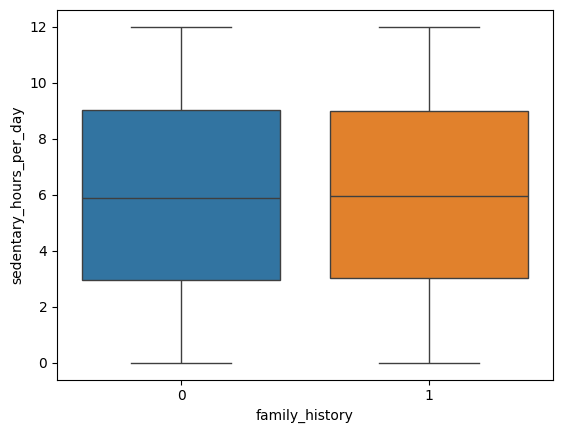

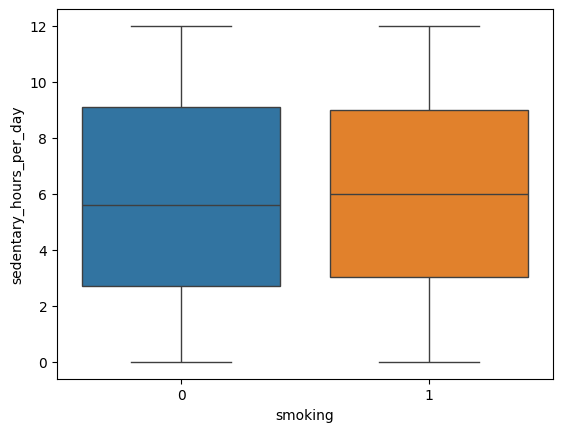

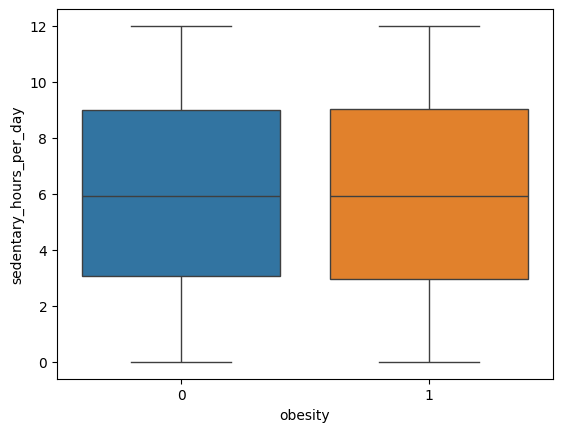

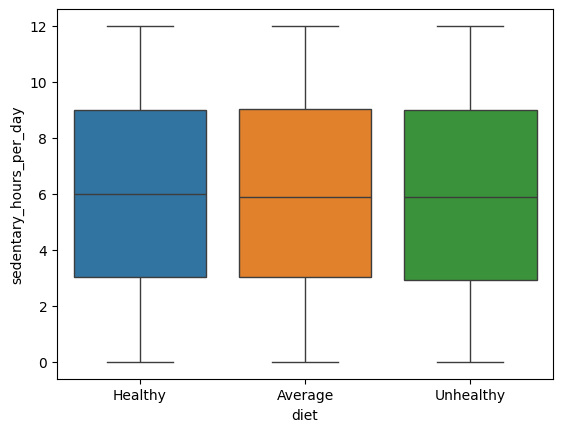

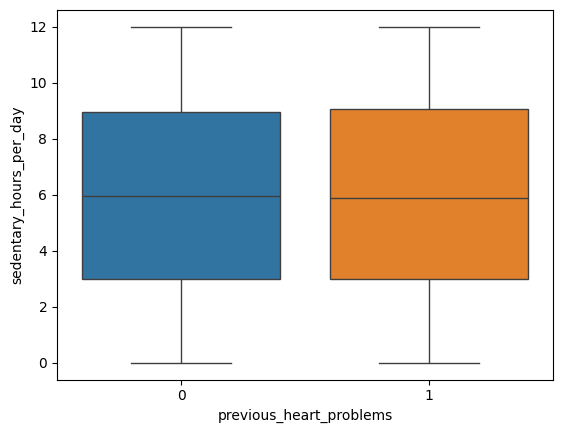

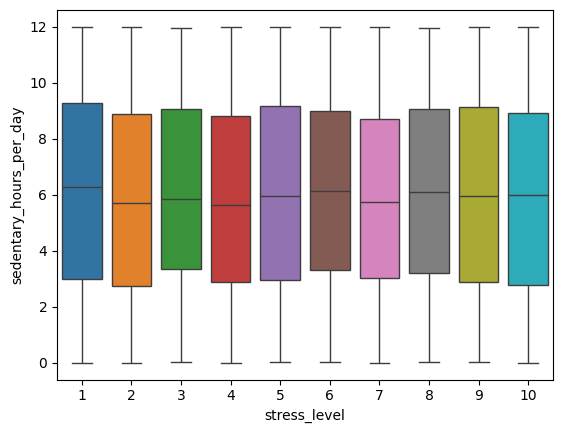

In [22]:
#la cantidad de horas sedentarias por dias es similar a través de todas las categorías
for f in frcv_cat:
  sns.boxplot(data=df_raw,y=target[1],x=f,hue=f,legend=False)
  plt.show()

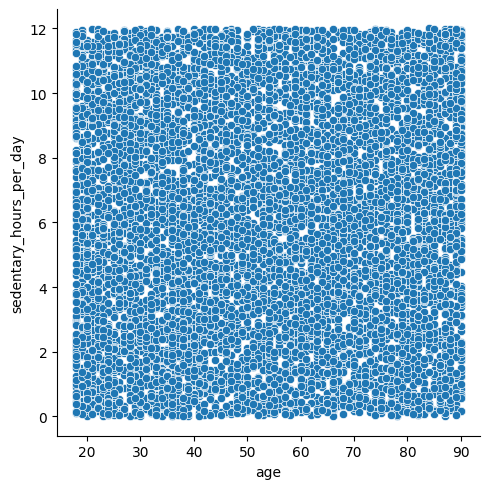

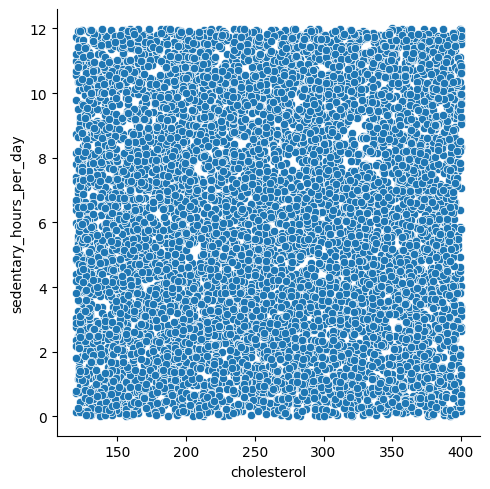

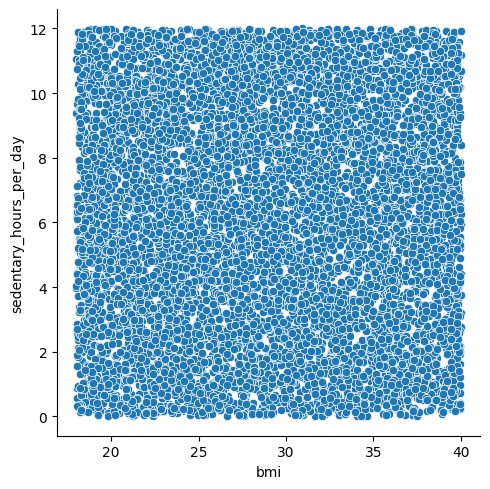

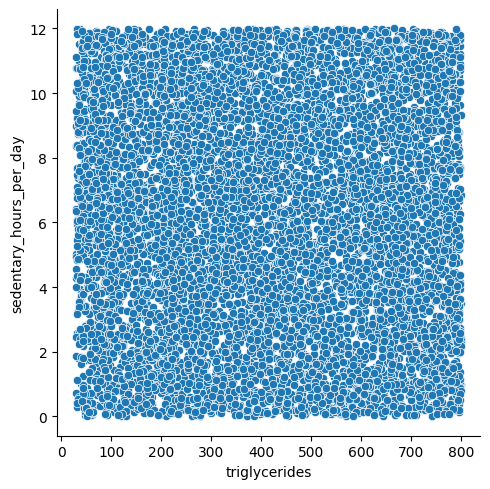

In [23]:
#distribuciones homogeneas sin tendencias
for f in frcv_con:
  sns.relplot(data=df_raw,x=f,y=target[1])
  plt.show()

Se puede concluir que las hs de sedentarismo son iguales a lo largo de todas las categorías exploradas

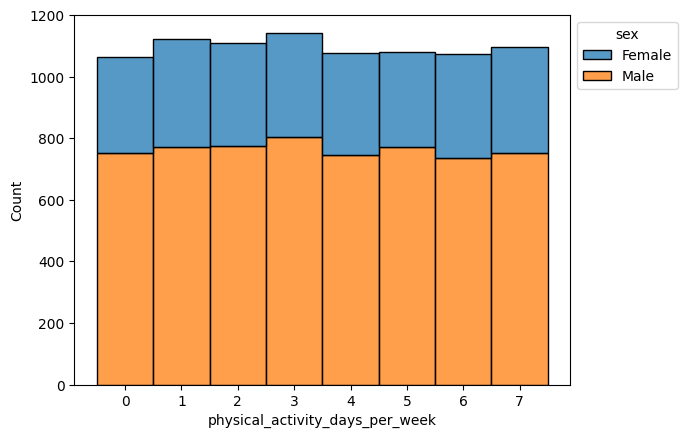

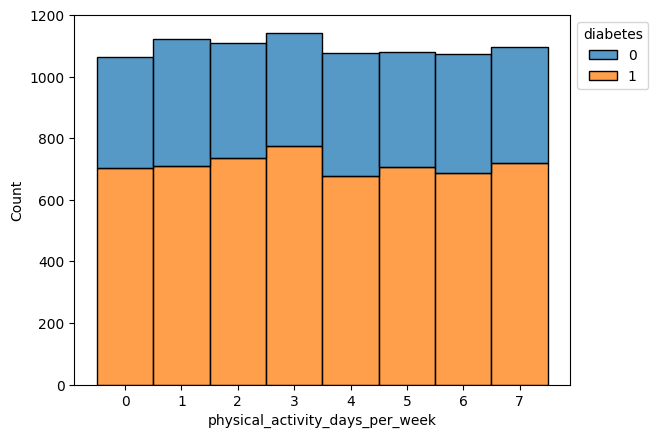

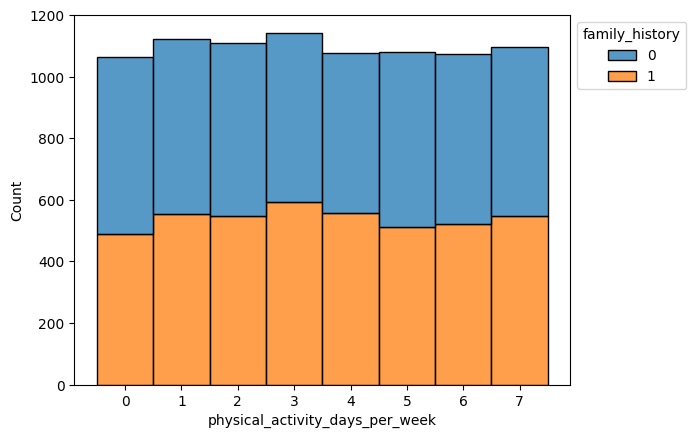

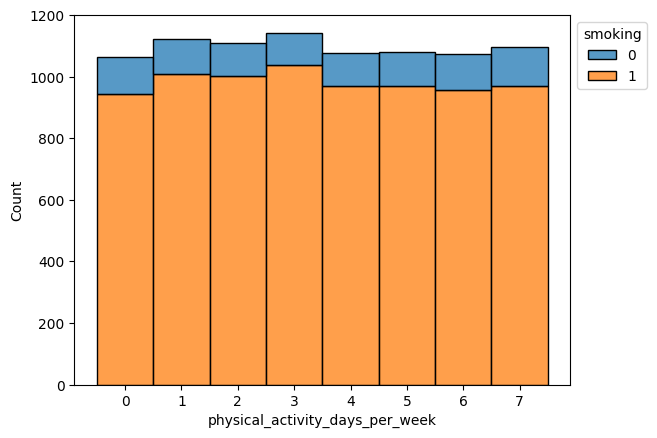

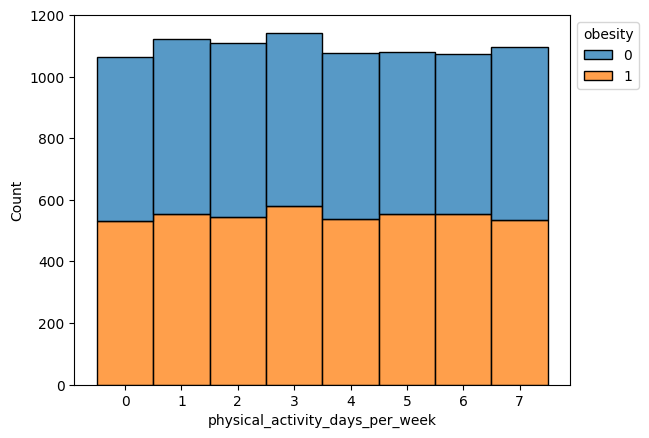

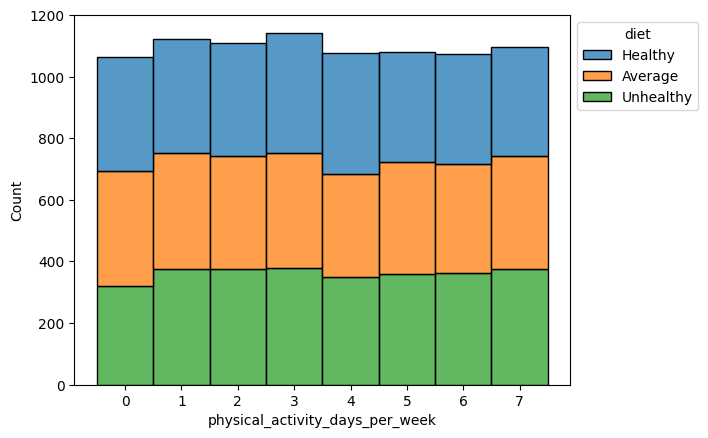

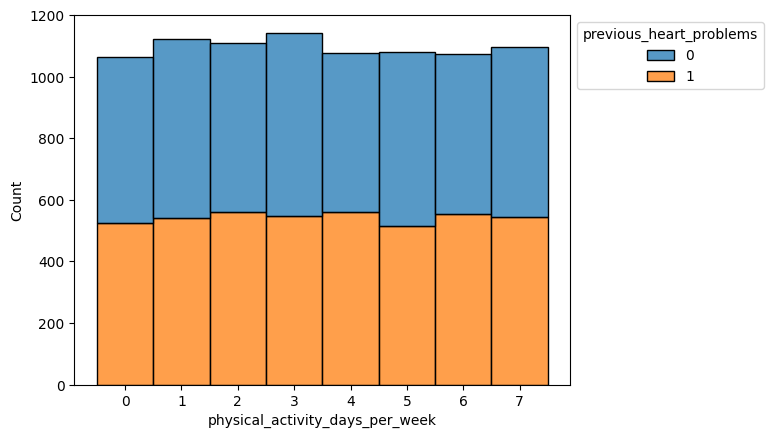

In [24]:
#misma conclusiones que para las otras dos variables de la variable anterior
for f in frcv_cat[:-1]:
  ax=sns.histplot(data=df_raw,x=target[2], hue=f,multiple='stack')
  sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
  plt.show()

<Axes: xlabel='stress_level', ylabel='physical_activity_days_per_week'>

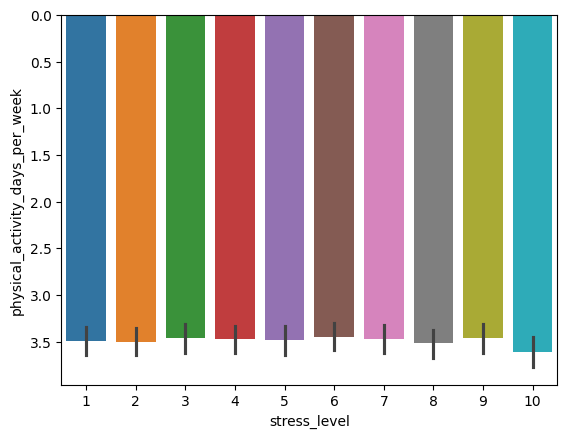

In [25]:
#todos lso niveles de stress tiene mas o menos la misma cantidad de hs sedentarias
sns.barplot(data=df_raw,y=target[2], x=frcv_cat[-1],hue=frcv_cat[-1],legend=False)

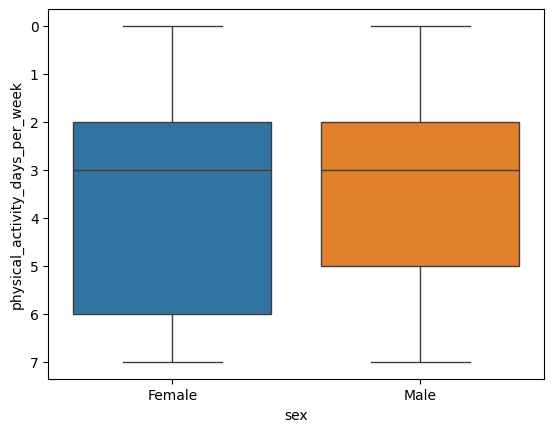

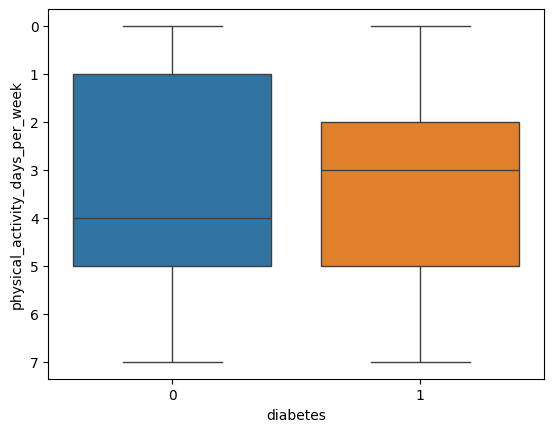

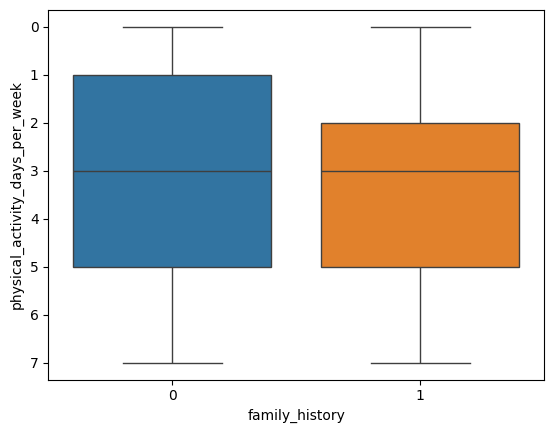

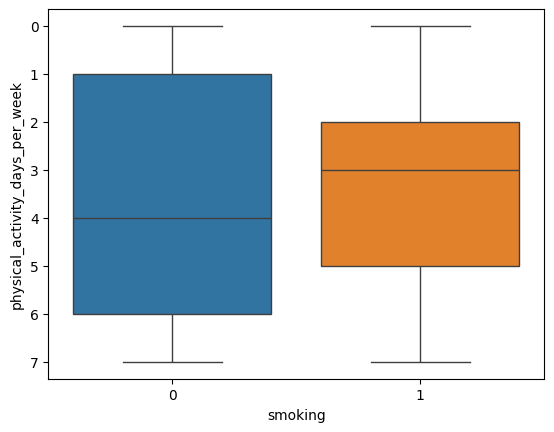

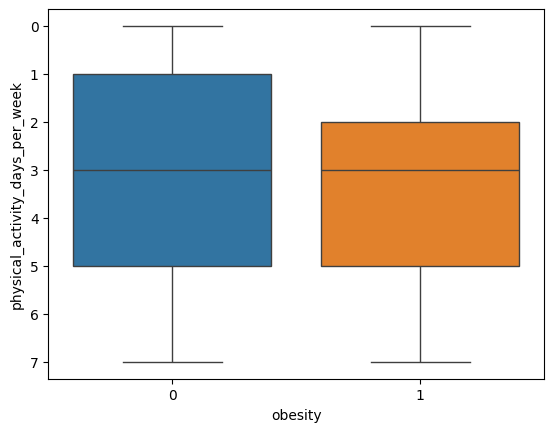

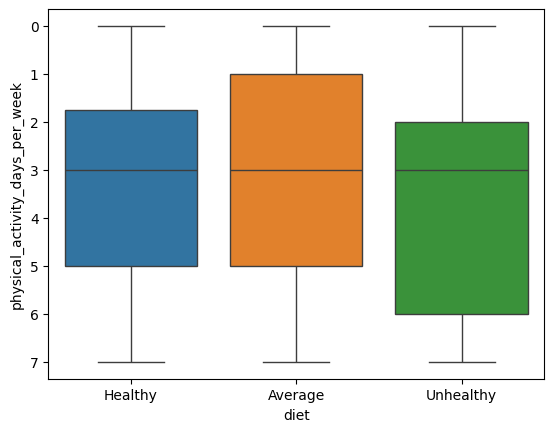

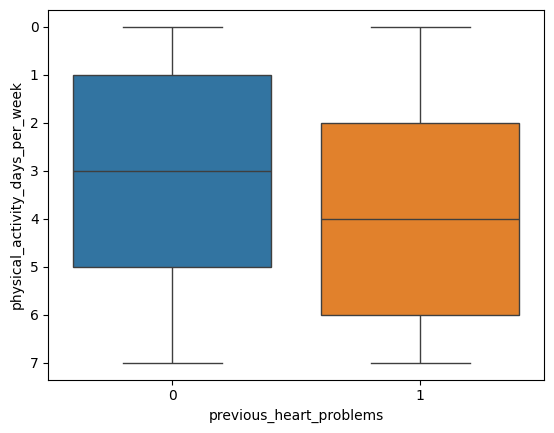

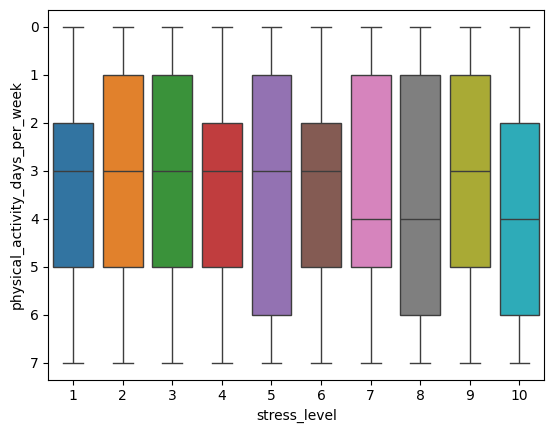

In [26]:
#pareceria haber una diferencia en la media de los dias de actividad física en diaèticos, en fumadores (siendo mayor) y menor en pacientes con problemas cardiacos previos y nlos niveles 7-8-10 de stress
for f in frcv_cat:
  sns.boxplot(data=df_raw,y=target[2],x=f,hue=f,legend=False)
  plt.show()

### Conclusión de la hipótesis 1: la cantidad de hs de ejercicio semanales y la cantidad de hs de sedentarismo no fueron influenciadas por los FRCV. Sin embargo, cuando se midió actividad física en cantidad de días de la semana se observò una mayor media (no comprobado estadìsticamente) en pacientes diabèticos y fumadores y menor en pacientes con problemas cardíacos previos y niveles de stress 7-8-10

### Hipótesis 2: Relacionar los niveles de tensión arterial sistólica y diastólica con los niveles de Stress

<Axes: xlabel='stress_level', ylabel='bps'>

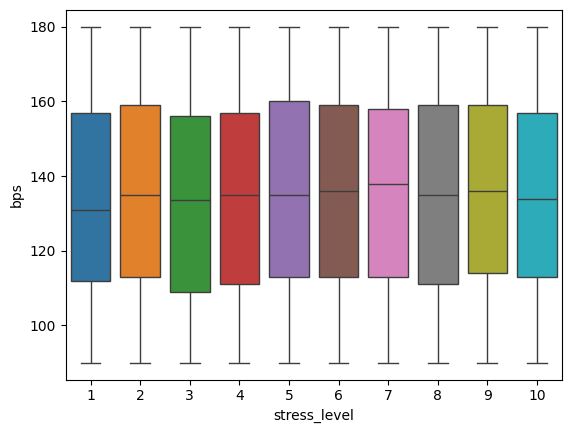

In [28]:
sns.boxplot(data=df_raw,y='bps',x='stress_level',hue='stress_level',legend=False)

<Axes: xlabel='stress_level', ylabel='bpd'>

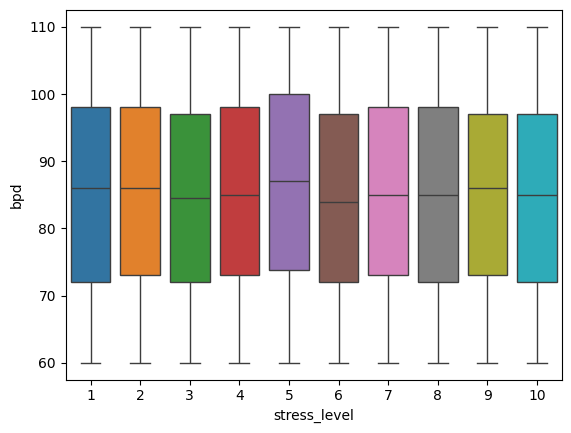

In [29]:
sns.boxplot(data=df_raw,y='bpd',x='stress_level',hue='stress_level',legend=False)

la presión diastólica y sistólica no parece variar significativamente a lo largo de los niveles de stress

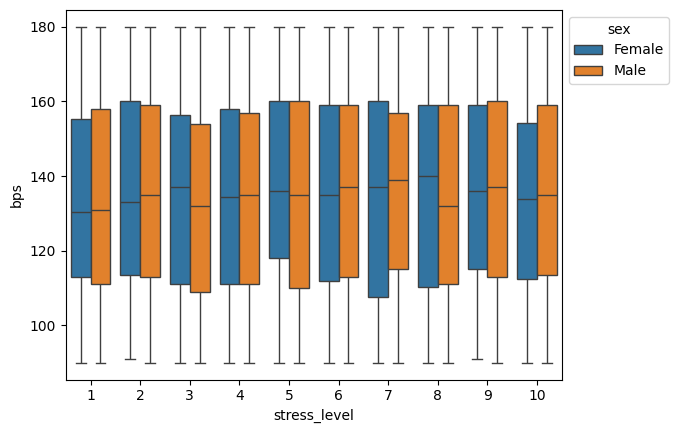

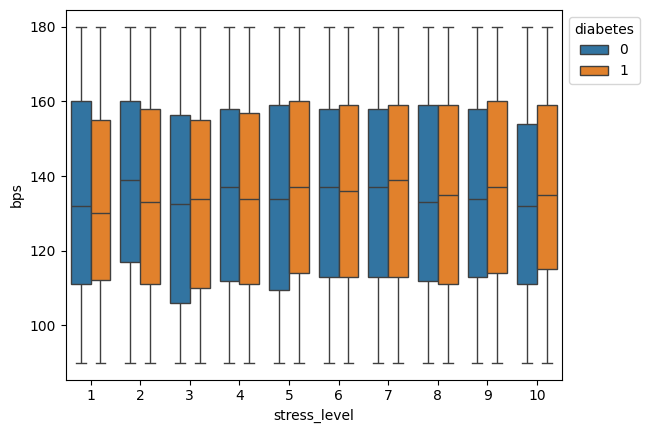

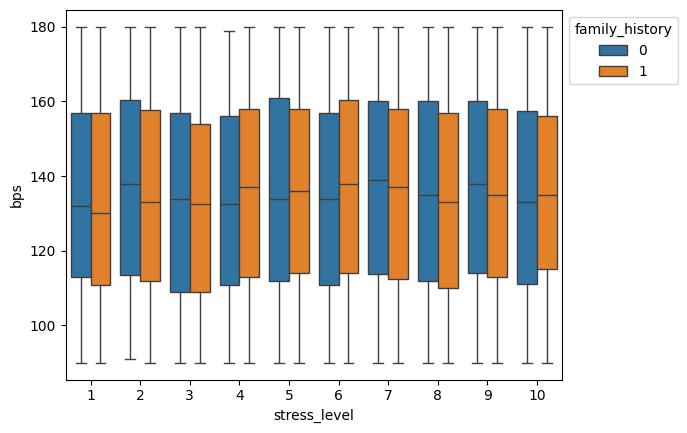

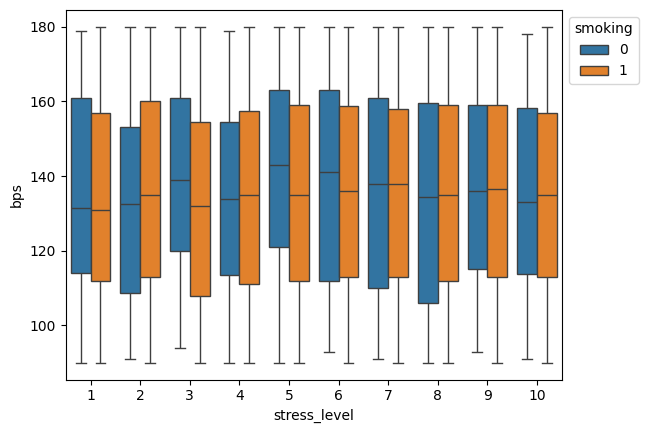

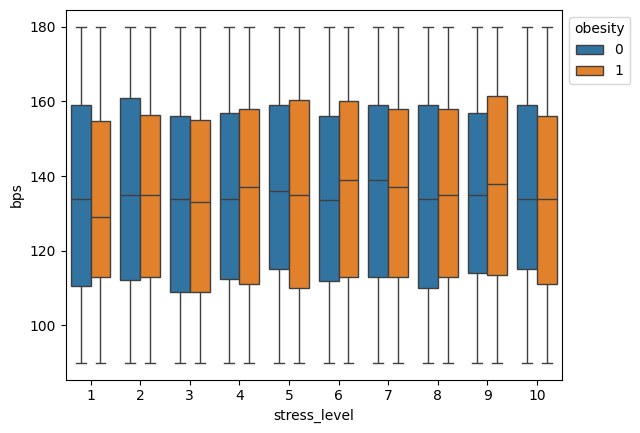

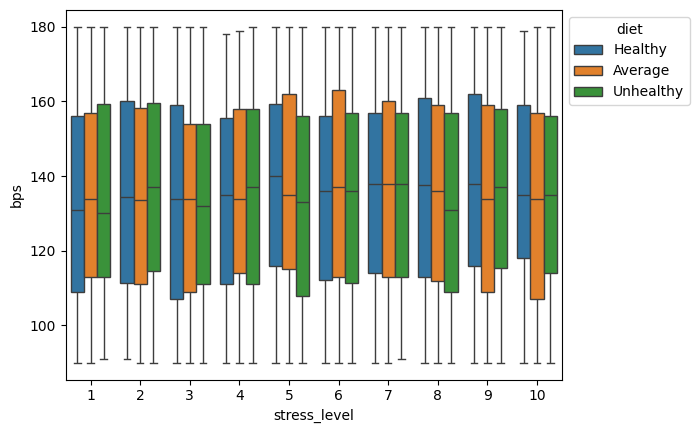

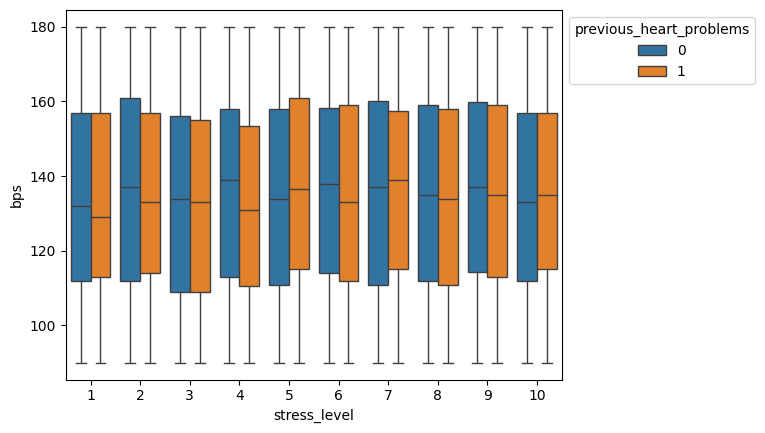

In [30]:
for f in frcv_cat[:-1]:
  ax=sns.boxplot(data=df_raw,y='bps',x='stress_level',hue=f)
  sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
  plt.show()

Cuando segmentamos por los factores de riesgo categóricos no se observan grandes variaciones de las presiones sistólica o diastólica

### Conclusión de la hipótesis 2: Las presiones sistólicas y diastólicas no se vieron influenciadas significativamente por los niveles de stress. Aún despues por ajustar por factores de riesgo cardiovasculares la distribución y valores medios de las presiones no demostraron diferencias significativas.

### Hipótesis 3: Relacionar país, región con  la dieta

In [102]:
#Recuerdo las listas con los FRCV y el target
target=df_raw.columns[-6:-3]
print(target)

Index(['country', 'continent', 'hemisphere'], dtype='object')


In [117]:
df_raw.groupby([target[2]])[target[1]].value_counts()

hemisphere           continent    
Northern Hemisphere  Asia             2543
                     Europe           1380
                     North America     860
                     Africa            448
                     South America     429
                     Australia           0
Southern Hemisphere  South America     933
                     Australia         884
                     Europe            861
                     Africa            425
                     Asia                0
                     North America       0
Name: count, dtype: int64

In [138]:
lista=df_raw.groupby([target[1]],as_index=False)[target[0]].value_counts()
lista[lista['count']!=0].reset_index(drop=True)

,continent,country,count
0,Africa,Nigeria,448
1,Africa,South Africa,425
2,Asia,China,436
3,Asia,Japan,433
4,Asia,Thailand,428
5,Asia,Vietnam,425
6,Asia,India,412
7,Asia,South Korea,409
8,Australia,Australia,449
9,Australia,New Zealand,435


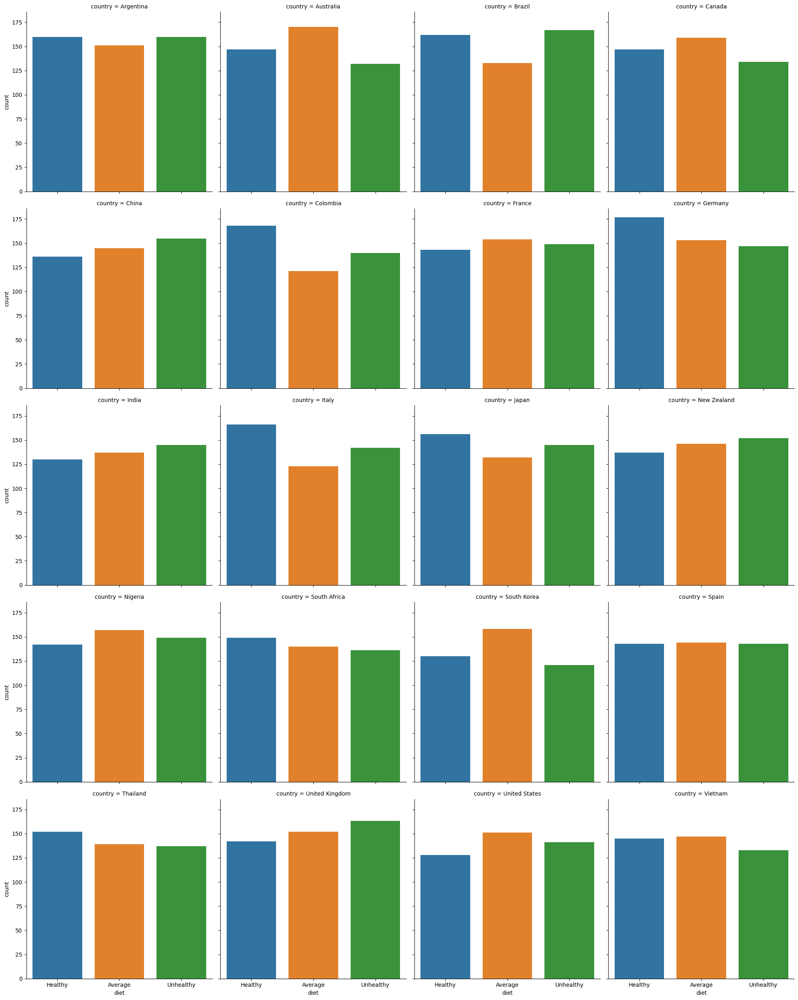

In [105]:
#en general las dietas tienen frecuencias similares
sns.catplot(data=df_raw,x='diet',col=target[0],col_wrap=4,kind='count', hue='diet')

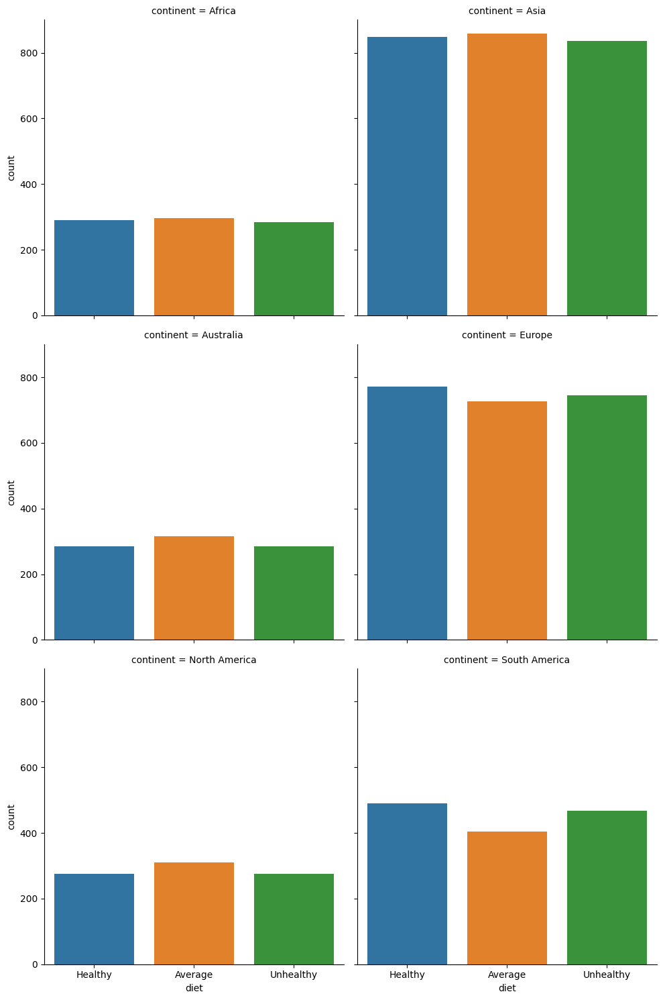

In [107]:
#Asia, europa y america del sur tienen la mayor cantidad de observaciones, pero la distribuci'on en general por continente es similar
sns.catplot(data=df_raw,x='diet',col=target[1],col_wrap=2,kind='count', hue='diet')

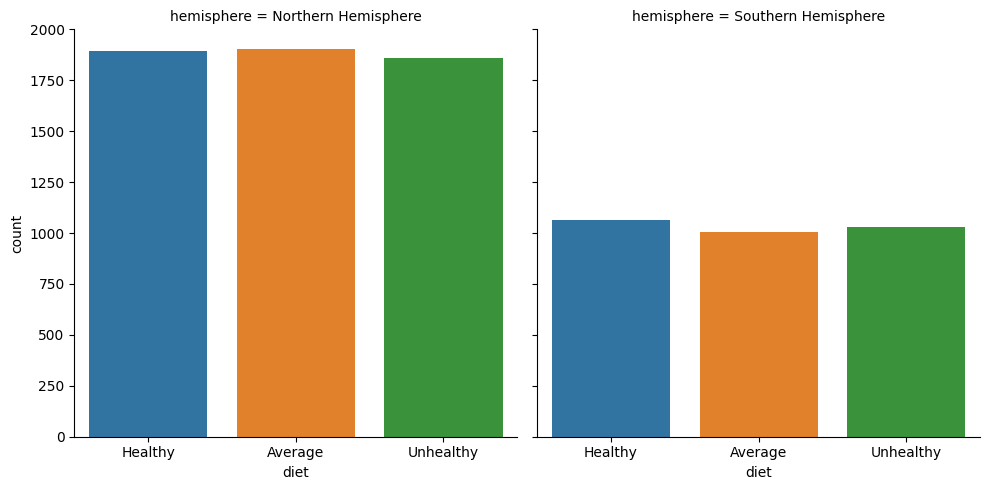

In [108]:
# hay mayor observacion de eventos en el hemisferio norte, las dietas siguen distribucion similar
sns.catplot(data=df_raw,x='diet',col=target[2],kind='count', hue='diet')

### Hipótesis 3: No se observa variación regional de la dieta en los distintos grupos geográficos analizados